### Gradient Flow Visualization Micrograd Pro

This notebook visually demonstrates how gradients propagate through neural networks using Micrograd Pro. We'll combine code, computation graphs, and vivid visualizations to build intuition for forward and backward passes, gradient descent, and parameter updates.

## <p style="font-family: Georgia; font-weight: normal; letter-spacing: 2px; color: #fabd2f;     font-size: 140%; text-align: left; padding: 0px; border-bottom: 3px solid #fabd2f;">Setup</p>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import networkx as nx
from IPython.display import HTML
import scipy as sp
from matplotlib.animation import FuncAnimation


# Micrograd Pro engine and neural network modules
import sys
sys.path.append('../core')
from engine import Value
from nn import Layer, Linear, Sequential, LayerNorm, Dropout, GELU, ReLU, LeakyReLU, Tanh

# Gruvbox-inspired Seaborn configuration for aesthetics
from cycler import cycler
gruvbox_colors = [
    "#fb4934",  # red
    "#fabd2f",  # yellow
    "#b8bb26",  # green
    "#83a598",  # blue
    "#d3869b",  # purple
    "#fe8019",  # orange
    "#8ec07c",  # aqua
]
rc = {
    "axes.facecolor": "#282828",
    "figure.facecolor": "#282828",
    "axes.edgecolor": "#3c3836",
    "grid.color": "#504945",
    "font.family": "arial",
    "axes.labelcolor": "#ebdbb2",
    "xtick.color": "#d5c4a1",
    "ytick.color": "#d5c4a1",
    "grid.alpha": 0.3,
    "axes.prop_cycle": cycler(color=gruvbox_colors),
}
sns.set(rc=rc, style="darkgrid")

## <p style="font-family: Georgia; font-weight: normal; letter-spacing: 2px; color: #fabd2f;     font-size: 140%; text-align: left; padding: 0px; border-bottom: 3px solid #fabd2f;">One Neuron</p>

In [2]:
# Define a simple Linear layer: 2 inputs, 1 output
layer = Linear(2, 1)

# Sample input
x = [Value(1.5), Value(-2.0)]

# Forward pass
out = layer(x)

# Compute a simple loss (e.g., squared error to target)
target = Value(0.5)
loss = (out[0] - target) ** 2

# Backward pass to populate gradients
loss.backward()

print("Output:", out[0].data)
print("Loss:", loss.data)
print("Gradient w.r.t input[0]:", x[0].grad)
print("Gradient w.r.t input[1]:", x[1].grad)

Output: -2.6080363390198142
Loss: 9.65988988466769
Gradient w.r.t input[0]: 2.781388007943308
Gradient w.r.t input[1]: -6.019830709200302


Everything works, let's proceed with some visuals and harder examples

## <p style="font-family: Georgia; font-weight: normal; letter-spacing: 2px; color: #fabd2f;     font-size: 140%; text-align: left; padding: 0px; border-bottom: 3px solid #fabd2f;">Visualize Forward and Backward Computation Graph</p>


We'll use networkx and matplotlib to visualize the computation graph for the forward pass and overlay gradient flow on the graph, color-coding edges by gradient magnitude.

Note: I had some trubles with graphviz dependencies so not sure if you will be able to see/run same visualizations locally, thus I created a PNG of each visuals and added them to pics folder

In [3]:
# Helper function to build the graph using NetworkX
from networkx.drawing.nx_agraph import graphviz_layout

def build_graph(value, graph=None, seen=None):
    if graph is None:
        graph = nx.DiGraph()
    if seen is None:
        seen = set()

    if value not in seen:
        seen.add(value)
        label = getattr(value, 'label', '')  # safely get label if exists
        graph.add_node(
            id(value),
            label=f"{label}\nval={value.data:.2f}\ngrad={value.grad:.2f}" if label else f"val={value.data:.2f}\ngrad={value.grad:.2f}",
            grad=value.grad,
        )
        for child in value._prev:
            graph.add_edge(id(child), id(value), op=value._op)
            build_graph(child, graph, seen)

    return graph


def plot_graph(graph, node_size=3600):
    # Compute layout
    pos = graphviz_layout(graph, prog="dot")
    labels = nx.get_node_attributes(graph, 'label')
    grads = nx.get_node_attributes(graph, 'grad')

    # Color mapping
    def color_for_grad(g, threshold=1e-6):
        if abs(g) < threshold:
            return "#cccccc"
        elif g > 0:
            return "#bea060"
        else:
            return "#c55151"

    node_colors = [color_for_grad(grads[n]) for n in graph.nodes]

    # Dynamic figure size: scale with number of nodes
    n_nodes = len(graph.nodes)
    width = max(8, n_nodes * 2.0)
    height = max(6, n_nodes * 1.0)
    plt.figure(figsize=(width, height))

    nx.draw(
        graph, pos,
        with_labels=True, labels=labels,
        node_color=node_colors, node_size=node_size,
        edge_color="#779e68", linewidths=2,
        font_size=11
    )
    edge_labels = nx.get_edge_attributes(graph, 'op')
    nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_labels,
                                 font_size=21, font_color="#b8bb26")
    plt.title("Computation Graph with Gradient Flow", fontsize=14)
    plt.show()

### Example: Simple Gradient Flow

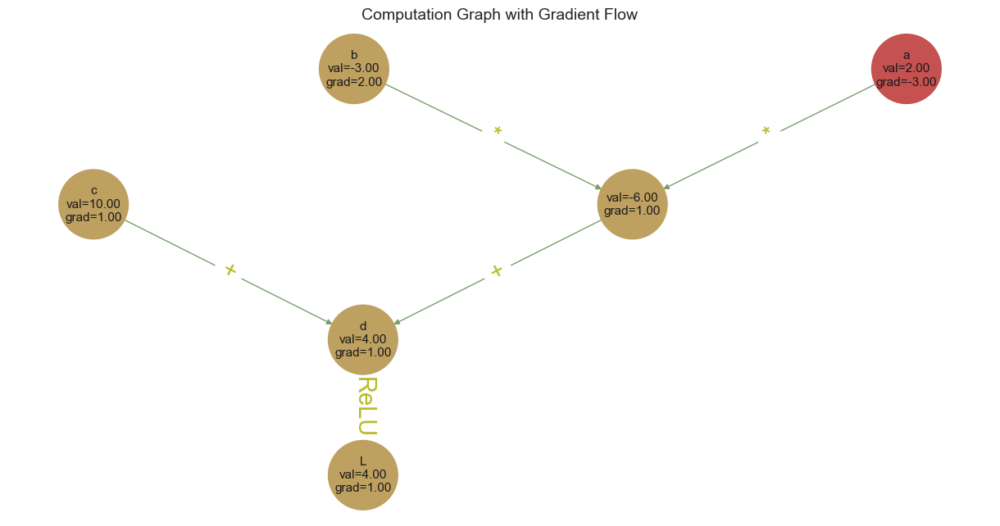

In [4]:
# Let's build a simple chain and backpropagate through it

a = Value(2.0)
b = Value(-3.0)
c = Value(10.0)

d = a * b + c

L = d.relu()

# add labels
a.label = 'a'
b.label = 'b'
c.label = 'c'
d.label = 'd'
L.label = 'L'

# Backpropagate
L.backward()

# Build and visualize
graph = build_graph(L)
plot_graph(graph)

### Example: Show how LeakyReLU works

In [5]:
# Let's build a simple chain and backpropagate through it

a = Value(2.0)
b = Value(-3.0)
c = Value(2.0)

d = a * b + c

L = d.leaky_relu()

# add labels
a.label = 'a'
b.label = 'b'
c.label = 'c'
d.label = 'd'
L.label = 'L'

# Backpropagate
L.backward()

print(f"L: {L}, L.grad: {L.grad}")
print(f"d: {d}, d.grad: {d.grad}")
print(f"a: {a}, a.grad: {a.grad}")
print(f"b: {b}, b.grad: {b.grad}")
print(f"c: {c}, c.grad: {c.grad}")

L: Value(data=-0.0400, grad=1.0000), L.grad: 1
d: Value(data=-4.0000, grad=0.0100), d.grad: 0.01
a: Value(data=2.0000, grad=-0.0300), a.grad: -0.03
b: Value(data=-3.0000, grad=0.0200), b.grad: 0.02
c: Value(data=2.0000, grad=0.0100), c.grad: 0.01


Let's double check it manually with some math, we have:

$d = a * b + c$

- $a = 2.0, b = -3.0, c = 2.0$
- So $a * b = -6.0, d = -6.0 + 2.0 = -4.0$

Then:

$L = \text{LeakyReLU}(d)$

LeakyReLU is defined as:

$\text{LeakyReLU}(x) = \begin{cases} x, & x>0 \\ \alpha x, & x\le 0 \end{cases}$

where $\alpha = 0.01$ by default.

Here, $d = -4.0 <= 0,$ so:

$L = \alpha * d = 0.01 * (-4.0) = -0.04$

Now to Compute backward:

$dL/dL = 1$ (always, for backward starting from scalar)

LeakyReLU derivative:

$\frac{dL}{dd} = \begin{cases} 1, & d>0 \\ \alpha, & d \le 0 \end{cases} = 0.01$

So now:

$d.grad = dL/dd = 0.01$

Next, backprop through $d = a*b + c:$

$\frac{dL}{da} = \frac{dL}{dd} * \frac{dd}{da} = 0.01 * b = 0.01 * (-3) = -0.03$

$\frac{dL}{db} = 0.01 * a = 0.01 * 2 = 0.02$

$\frac{dL}{dc} = 0.01 * 1 = 0.01$

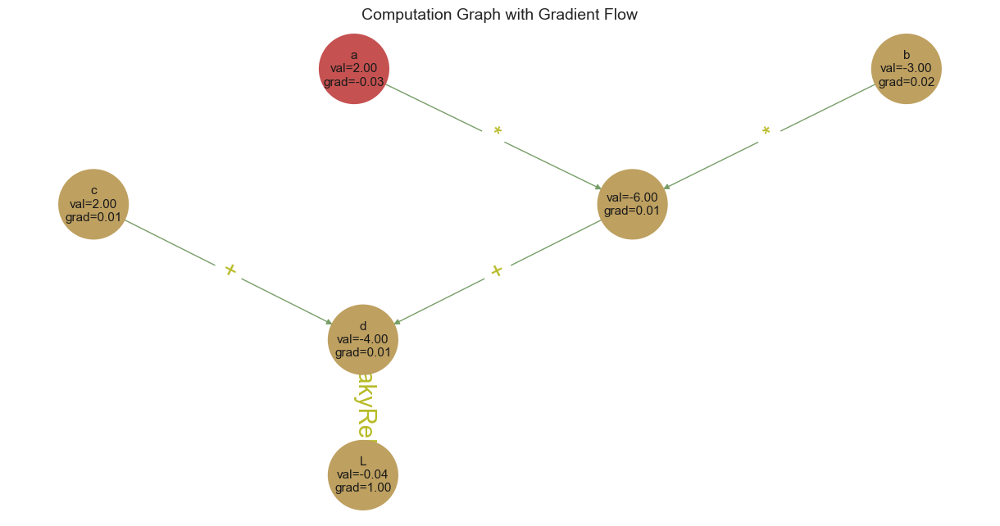

In [6]:
# Build and visualize
graph = build_graph(L)
plot_graph(graph)

In [7]:
# Let's build a little bigger chain and backpropagate through it

a = Value(5.0)
b = Value(-3.0)
c = Value(10.0)

d = a * b + c

f = Value(5)
g = d / f

h = Value(3)

j = g + h

L = j.gelu()

# add labels
a.label = 'a'
b.label = 'b'
c.label = 'c'
d.label = 'd'
f.label = 'f'
g.label = 'g'
h.label = 'h'
j.label = 'j'
L.label = 'L'

# Backpropagate
L.backward()

print(f"L: {L}, L.grad: {L.grad}")
print(f"j: {j}, j.grad: {j.grad}")
print(f"h: {h}, h.grad: {h.grad}")
print(f"g: {g}, g.grad: {g.grad}")
print(f"f: {f}, f.grad: {f.grad}")
print(f"d: {d}, d.grad: {d.grad}")
print(f"c: {c}, c.grad: {c.grad}")
print(f"b: {b}, b.grad: {b.grad}")
print(f"a: {a}, a.grad: {a.grad}")

L: Value(data=1.9546, grad=1.0000), L.grad: 1
j: Value(data=2.0000, grad=1.0861), j.grad: 1.0860992566236183
h: Value(data=3.0000, grad=1.0861), h.grad: 1.0860992566236183
g: Value(data=-1.0000, grad=1.0861), g.grad: 1.0860992566236183
f: Value(data=5.0000, grad=0.2172), f.grad: 0.21721985132472366
d: Value(data=-5.0000, grad=0.2172), d.grad: 0.21721985132472366
c: Value(data=10.0000, grad=0.2172), c.grad: 0.21721985132472366
b: Value(data=-3.0000, grad=1.0861), b.grad: 1.0860992566236183
a: Value(data=5.0000, grad=-0.6517), a.grad: -0.651659553974171


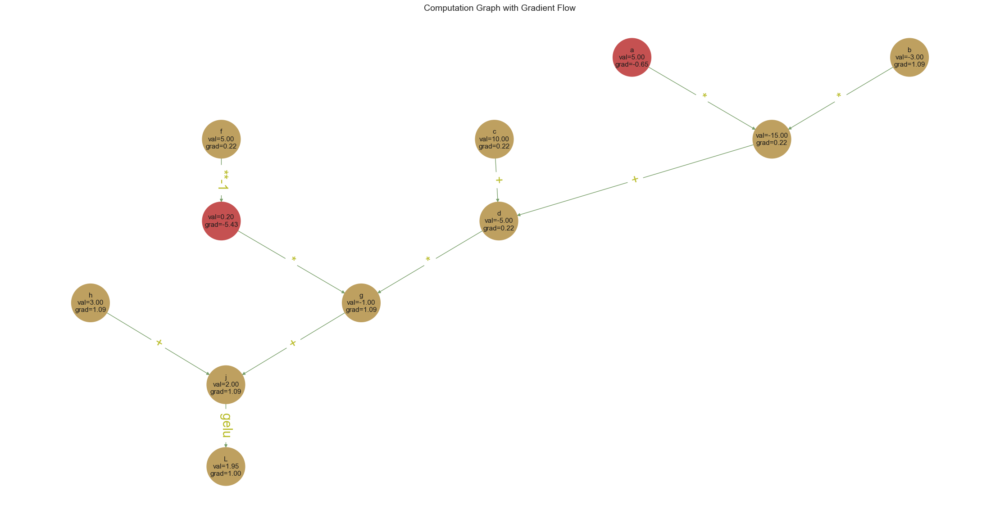

In [8]:
# Build and visualize
graph = build_graph(L)
plot_graph(graph)

Perfect, I think this tree layout really showcase how gradients travel with what operations!

## <p style="font-family: Georgia; font-weight: normal; letter-spacing: 2px; color: #fabd2f;     font-size: 140%; text-align: left; padding: 0px; border-bottom: 3px solid #fabd2f;">Gradient Descent Intuition (3D Visualization)</p>



Let's define a simple 2D loss surface and plot it using matplotlib's 3D plotting tools to visualize the landscape for gradient descent.

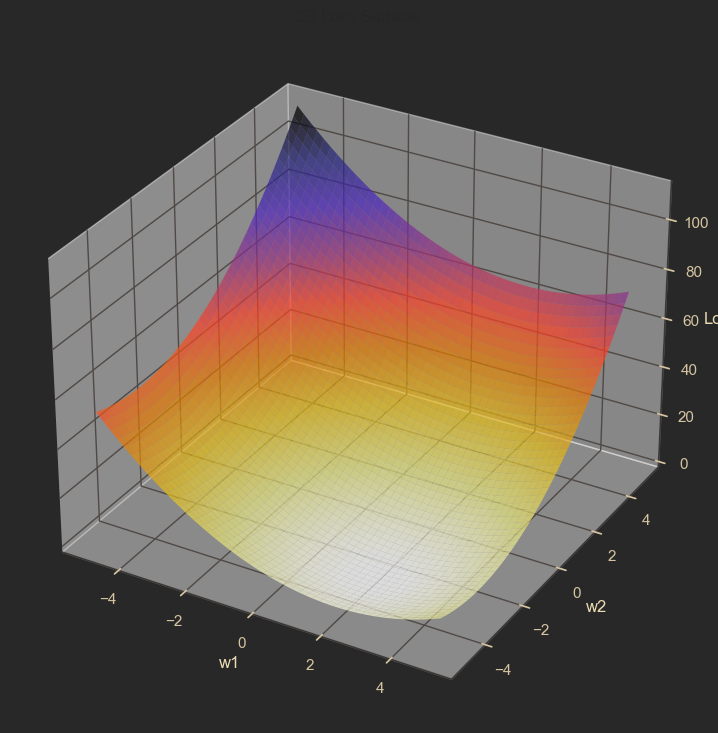

In [9]:
def loss_surface(w1, w2):
    return (w1 - 2)**2 + (w2 + 3)**2

W1, W2 = np.meshgrid(np.linspace(-5, 5, 50), np.linspace(-5, 5, 50))
L = loss_surface(W1, W2)

fig = plt.figure(figsize=(16,9))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W1, W2, L, cmap='CMRmap_r', alpha=0.7, linewidth=0, antialiased=True)
ax.set_xlabel('w1')
ax.set_ylabel('w2')
ax.set_zlabel('Loss')
ax.set_title('2D Loss Surface')
plt.show()

Now knowing we can build surfaces like this, let's build some that actually comes from our tiny neural network. 

First let's work with one Layer:

We we'll build something like this:

$L = (y_{pred} - y_{true})^2$

Where, 

$y_{pred} = ReLU(x_1 * w_1 + x_2*w_2 + b)$

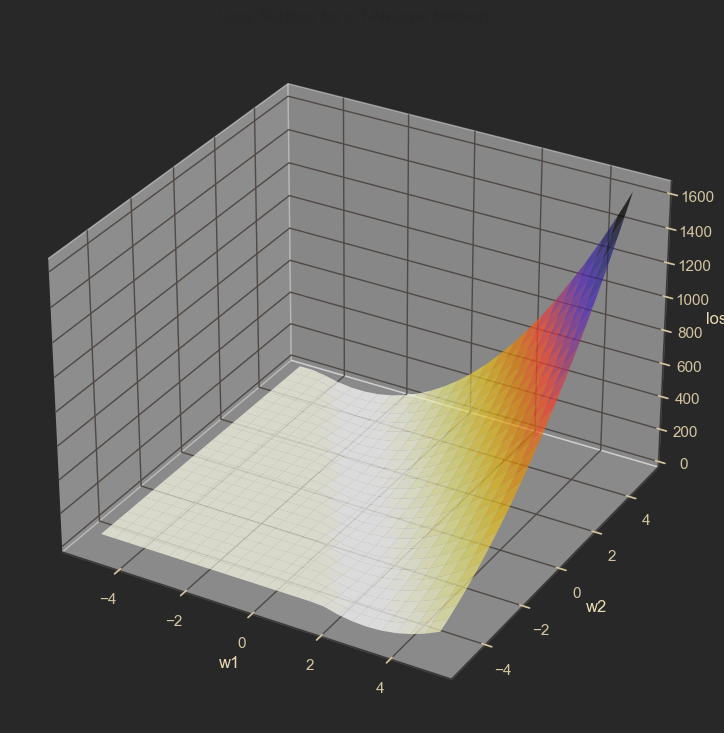

In [10]:
# So, let's build and visualize it
# First, define a simple network as a forward function:

# just working with Value object for now, no layers
def forward(x1, x2, w1, w2, b):
    return (x1 * w1 + x2 * w2 + b).relu()

# now write a loss functions for this simlpe network
def compute_loss(x1, x2, w1, w2, b, target):
    y_pred = forward(x1, x2, w1, w2, b)
    loss = (y_pred - target) ** 2
    return loss

# inputs
x1 = Value(5.0)
x2 = Value(3.0)
y_true = Value(6.5)
b = Value(7.0)

# generate grid
W1, W2 = np.meshgrid(np.linspace(-5, 5, 25), np.linspace(-5, 5, 25))
L = np.zeros_like(W1)

# compute loss for each weights pair
for i in range(W1.shape[0]):
    for j in range(W1.shape[1]):
        w1 = Value(W1[i, j])
        w2 = Value(W2[i, j])
        loss = compute_loss(x1, x2, w1, w2, b, y_true)
        L[i, j] = loss.data
        
fig = plt.figure(figsize=(16, 9))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W1, W2, L, cmap='CMRmap_r', alpha=0.7, linewidth=0, antialiased=True)
ax.set_xlabel("w1")
ax.set_ylabel("w2")
ax.set_zlabel("loss")
ax.set_title("Loss Surface for a 1-Neuron Network")
plt.show()

**Note:** minimal makes sense since it's surface for each combination of possilbe weights

Now let's make it a bit more complex:

Sequential(Linear, GELU, LayerNorm, Linear)
w1: Value(data=-0.1484, grad=0.0000), w2: Value(data=-0.2243, grad=0.0000)


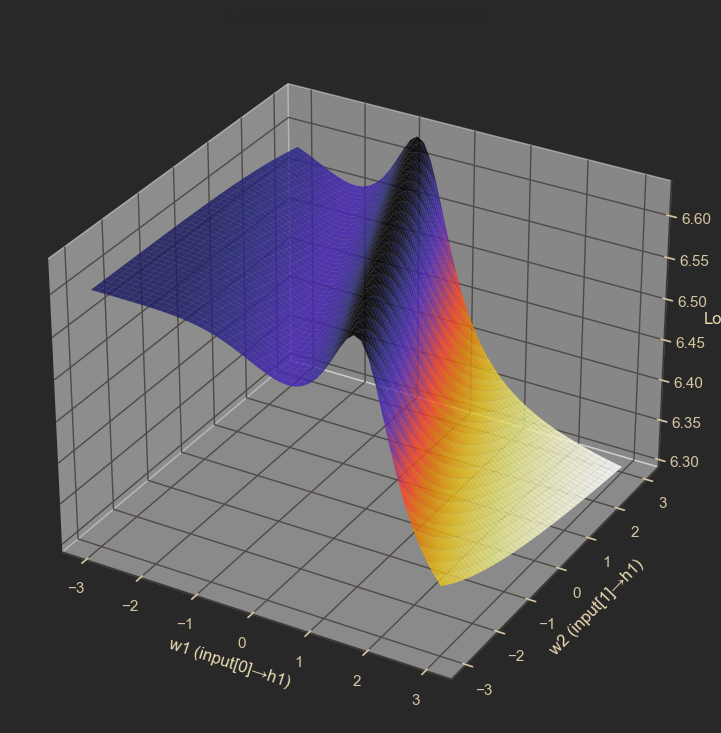

In [11]:
# First create a model using micrograd pro utilities:
# However we still limited to 2 weights for this visualization approach, 
# so we are not going to visualize all the weights with landscape for gradient descent
# only selected 2
model = Sequential(
    Linear(2, 4),
    GELU(),
    LayerNorm(4),
    Linear(4, 1)
)

print(model)

# Synthetic data
x = [Value(1.0), Value(0.39)]
y_true = Value(2.5)

L1 = model.layers[0]   # first Linear layer
w1 = L1.weights[0]     # weight from input[0] → neuron[0]
w2 = L1.weights[2]     # weight from input[2] → neuron[0]

print(f"w1: {w1}, w2: {w2}")

def compute_loss(w1_val, w2_val):
    # Temporarily modify two selected weights
    L1.weights[0].data = w1_val
    L1.weights[1].data = w2_val

    # Reset grads
    for p in model.parameters():
        p.grad = 0.0

    # Forward pass
    y_pred = model(x)
    loss = (y_pred[0] - y_true) ** 2

    return float(loss.data)


# Create grid
W1, W2 = np.meshgrid(np.linspace(-3, 3, 50), np.linspace(-3, 3, 50))
L = np.zeros_like(W1)

# Evaluate loss surface
for i in range(W1.shape[0]):
    for j in range(W1.shape[1]):
        L[i, j] = compute_loss(W1[i, j], W2[i, j])

# Plot 3D surface
fig = plt.figure(figsize=(16, 9))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W1, W2, L, cmap='CMRmap_r', alpha=0.85, linewidth=0)
ax.set_xlabel('w1 (input[0]→h1)')
ax.set_ylabel('w2 (input[1]→h1)')
ax.set_zlabel('Loss')
ax.set_title('Loss Surface for Selected Weights')
plt.show()

**Note:** I would suggest playing with data, for example changing these parameters and see how it affects the graph

```python
x = [Value(1.0), Value(0.39)]
y_true = Value(2.5)
```

Now I also decided to run forward and backward on previous example and build the computation graph to show you our models parameters. 

In [12]:
# Run a forward and backward pass to populate gradients
loss = (model(x)[0] - y_true) ** 2
loss.backward()

# Show the computation graph
graph = build_graph(loss)
plot_graph(graph)

## <p style="font-family: Georgia; font-weight: normal; letter-spacing: 2px; color: #fabd2f;     font-size: 140%; text-align: left; padding: 0px; border-bottom: 3px solid #fabd2f;">Animate Gradient Descent Trajectory</p> 



We'll animate the path of gradient descent on the loss surface, showing step-by-step parameter updates.

I am going to use the same model achitecture from previous example

Sequential(Linear, ReLU, LayerNorm, Linear)
Initial w1 = -3.8  | w2 = 0
[Value(data=-0.1660, grad=0.0000), Value(data=0.4406, grad=0.0000), Value(data=-0.9998, grad=0.0000), Value(data=-0.3953, grad=0.0000), Value(data=-0.7065, grad=0.0000), Value(data=-0.8153, grad=0.0000), Value(data=-0.6275, grad=0.0000), Value(data=-0.3089, grad=0.0000), Value(data=0.0000, grad=0.0000), Value(data=0.0000, grad=0.0000), Value(data=0.0000, grad=0.0000), Value(data=0.0000, grad=0.0000), Value(data=1.0000, grad=0.0000), Value(data=1.0000, grad=0.0000), Value(data=1.0000, grad=0.0000), Value(data=1.0000, grad=0.0000), Value(data=0.0000, grad=0.0000), Value(data=0.0000, grad=0.0000), Value(data=0.0000, grad=0.0000), Value(data=0.0000, grad=0.0000), Value(data=-3.8000, grad=0.0000), Value(data=0.0776, grad=0.0000), Value(data=0.0000, grad=0.0000), Value(data=0.3704, grad=0.0000), Value(data=0.0000, grad=0.0000)]


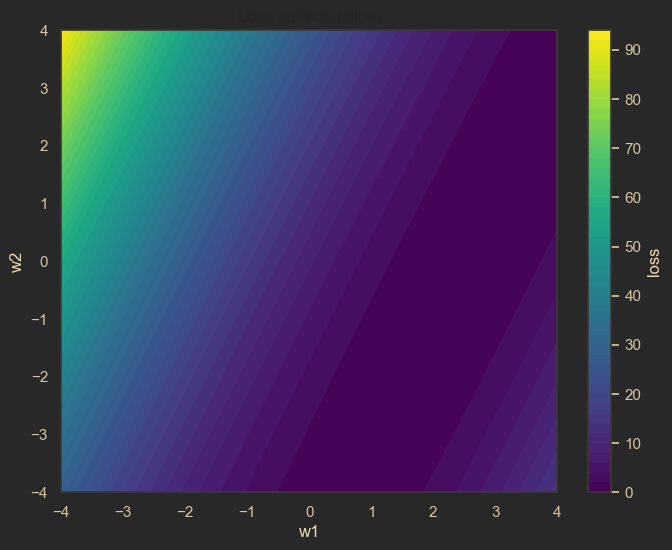

In [13]:
np.random.seed(1)

model = Sequential(
    Linear(2, 4),
#    GELU(),
    ReLU(),
    LayerNorm(4),
    Linear(4, 1)
)

print(model)

# weights
# two parameters to visualize (from first Linear layer)
L1 = model.layers[3]   # first 3rd layer
w1 = L1.weights[0]
w2 = L1.weights[2]    

# For clarity in visualization
w1.label = "w1"
w2.label = "w2"

# Start from "bad" initial weights to make path visible
w1.data = -3.8
w2.data = 0
print("Initial w1 =", w1.data, " | w2 =", w2.data)

# need to add more data:
# Synthetic dataset (3 points)
xs = [
    [Value(1.0), Value(0.39)],
    [Value(0.2), Value(-0.1)],
    [Value(-0.5), Value(0.9)]
]
ys = [Value(2.5), Value(0.3), Value(4.0)]

def compute_total_loss():
    preds = [model(xi)[0] for xi in xs]
    losses = [(p - yi)**2 for p, yi in zip(preds, ys)]
    total = sum(losses) / len(losses)
    return total

def compute_loss_given_pair(w1_val, w2_val):
    orig_w1, orig_w2 = w1.data, w2.data
    w1.data = float(w1_val)
    w2.data = float(w2_val)

    for p in model.parameters():
        p.grad = 0.0

    loss = compute_total_loss()
    val = float(loss.data)

    w1.data, w2.data = orig_w1, orig_w2
    return val

grid_n = 60
w1_range = np.linspace(-4.0, 4.0, grid_n)
w2_range = np.linspace(-4.0, 4.0, grid_n)
W1, W2 = np.meshgrid(w1_range, w2_range)
L = np.zeros_like(W1)

for i in range(grid_n):
    for j in range(grid_n):
        L[i, j] = compute_loss_given_pair(W1[i, j], W2[i, j])
        
print(model.parameters())

plt.figure(figsize=(8,6))
cs = plt.contourf(W1, W2, L, levels=50, cmap='viridis')
plt.colorbar(cs, label='loss')
plt.xlabel('w1'); plt.ylabel('w2')
plt.title('Loss surface (slice)')
plt.show()

Now we do gradient descent with tracked trajectory.

Note: We also use SGD which stands for Stochastic Gradient Descent, it's an optimazation algorithm, and I haven't really covered it in micrograd pro yet, but you can and should read about it:
- https://en.wikipedia.org/wiki/Stochastic_gradient_descent
- https://docs.pytorch.org/docs/stable/generated/torch.optim.SGD.html
- https://arxiv.org/pdf/1609.04747

In [14]:
def sgd_step(params, lr=0.05):
    for p in params:
        p.data += -lr * p.grad

lr = 0.05
steps = 100
traj = []

for t in range(steps):
    for p in model.parameters():
        p.grad = 0.0

    loss = compute_total_loss()
    loss.backward()

    traj.append((float(w1.data), float(w2.data), float(loss.data)))
    sgd_step(model.parameters(), lr=lr)

traj = np.array(traj)
print(f"Final (w1, w2, loss): {traj[-1]}")
print(model.parameters())

Final (w1, w2, loss): [-3.15942614 -0.05557848  0.01819694]
[Value(data=-99.9031, grad=0.0000), Value(data=-38.9221, grad=0.0000), Value(data=2.6137, grad=0.0005), Value(data=2.6756, grad=-0.0115), Value(data=-0.7065, grad=0.0000), Value(data=-0.8153, grad=0.0000), Value(data=0.3241, grad=0.0426), Value(data=-1.9300, grad=0.0460), Value(data=-100.3745, grad=0.0000), Value(data=5.1765, grad=0.0528), Value(data=0.0000, grad=0.0000), Value(data=1.9024, grad=-0.0893), Value(data=-3.1417, grad=0.0542), Value(data=0.5859, grad=-0.0064), Value(data=0.8545, grad=0.0010), Value(data=1.2367, grad=-0.0576), Value(data=-2.6277, grad=0.0399), Value(data=-0.1962, grad=-0.0022), Value(data=0.1005, grad=0.0007), Value(data=0.1583, grad=0.0101), Value(data=-3.1638, grad=0.0871), Value(data=0.1719, grad=-0.0195), Value(data=-0.0548, grad=-0.0159), Value(data=-0.8063, grad=0.0866), Value(data=0.7340, grad=-0.0126)]


In [15]:
print(traj[0:5])

[[-3.8         0.         52.73172698]
 [-2.96726843 -0.38922778  4.64076189]
 [-2.82458991 -0.31714962  3.62082648]
 [-2.86218338 -0.38031592  2.81623791]
 [-2.80309832 -0.33670352  2.45586939]]


Now we animate trajectory over the contour surface

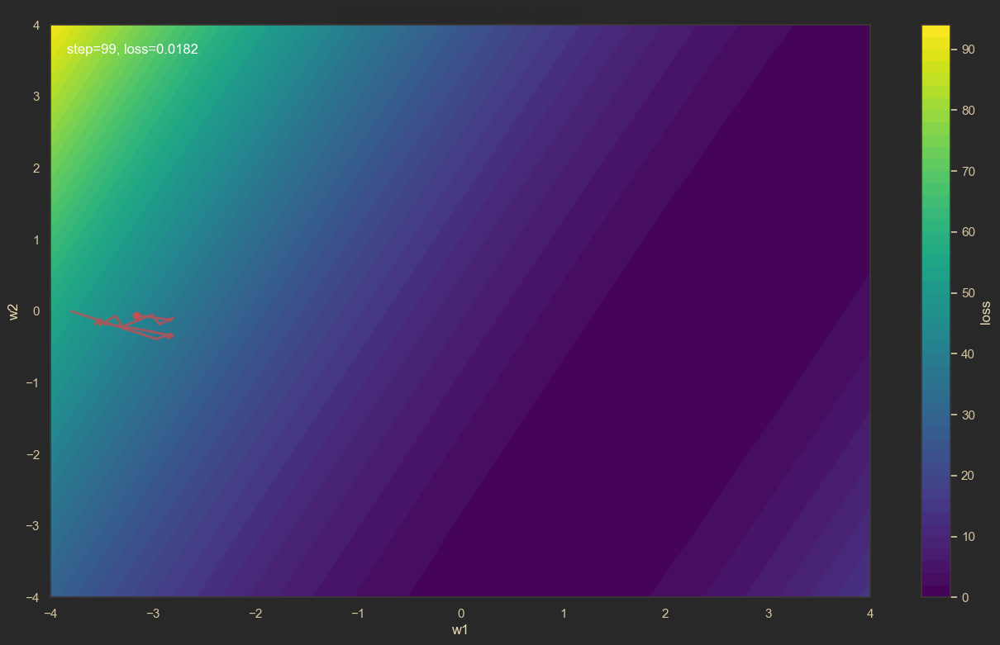

In [16]:
fig, ax = plt.subplots(figsize=(16,9))
cont = ax.contourf(W1, W2, L, levels=60, cmap='viridis')
cbar = fig.colorbar(cont, ax=ax)
cbar.set_label('loss')
ax.set_xlabel('w1')
ax.set_ylabel('w2')
ax.set_title('Gradient Descent Path on Loss Surface')

# Initialize the moving point and trajectory line
point, = ax.plot([], [], 'ro', markersize=6)
path_line, = ax.plot([], [], 'r-', linewidth=2, alpha=0.8)
txt = ax.text(0.02, 0.95, '', transform=ax.transAxes, color='white')

def init():
    point.set_data([], [])
    path_line.set_data([], [])
    txt.set_text('')
    return point, path_line, txt

def update(frame):
    xs = traj[:frame+1, 0]
    ys = traj[:frame+1, 1]

    # Ensure x/y are iterable for set_data
    point.set_data([xs[-1]], [ys[-1]])   # single-element lists
    path_line.set_data(xs, ys)

    loss_val = traj[frame, 2]
    txt.set_text(f"step={frame}, loss={loss_val:.4f}")
    return point, path_line, txt

ani = FuncAnimation(
    fig, update, frames=len(traj),
    init_func=init, blit=True, interval=300, repeat=False
)

HTML(ani.to_jshtml())

In [17]:
print(len(model.parameters()))
print(model.parameters())

25
[Value(data=-99.9031, grad=0.0000), Value(data=-38.9221, grad=0.0000), Value(data=2.6137, grad=0.0005), Value(data=2.6756, grad=-0.0115), Value(data=-0.7065, grad=0.0000), Value(data=-0.8153, grad=0.0000), Value(data=0.3241, grad=0.0426), Value(data=-1.9300, grad=0.0460), Value(data=-100.3745, grad=0.0000), Value(data=5.1765, grad=0.0528), Value(data=0.0000, grad=0.0000), Value(data=1.9024, grad=-0.0893), Value(data=-3.1417, grad=0.0542), Value(data=0.5859, grad=-0.0064), Value(data=0.8545, grad=0.0010), Value(data=1.2367, grad=-0.0576), Value(data=-2.6277, grad=0.0399), Value(data=-0.1962, grad=-0.0022), Value(data=0.1005, grad=0.0007), Value(data=0.1583, grad=0.0101), Value(data=-3.1638, grad=0.0871), Value(data=0.1719, grad=-0.0195), Value(data=-0.0548, grad=-0.0159), Value(data=-0.8063, grad=0.0866), Value(data=0.7340, grad=-0.0126)]


**Important Notes:**

1. High-dimensional space vs. 2D slice

* Keep in mind that this model has 25 parameters, not just w1 and w2. I deliberately left some ambiguity here, because examples with oversimplified models are everywhere. It’s easy to track 1–3 parameters visually, but once you have 25 parameters, it becomes much harder to interpret the model’s behavior. This illustrates why neural networks are often treated as black boxes, and it’s mind-blowing to imagine architectures with billions of parameters.
    
* In our visualization, we plot loss as a function of just 2 parameters. The other parameters are effectively fixed for the purpose of the 2D slice, but in reality, all parameters are updated. Every time we call loss.backward() followed by sgd_step(model.parameters(), lr), every weight, bias, and LayerNorm gamma/beta receives a gradient update.

2. Why the trajectory looks “weird”

* The trajectory on this 2D plane may appear strange because the optimizer moves in the full 25-dimensional space. While the 2D slice shows only w1 vs w2, other parameters are changing simultaneously. As a result, the loss might visually increase or stagnate in the 2D projection, even though in the full parameter space it is decreasing. This is normal and not a mistake.

## <p style="font-family: Georgia; font-weight: normal; letter-spacing: 2px; color: #fabd2f;     font-size: 140%; text-align: left; padding: 0px; border-bottom: 3px solid #fabd2f;">Some more examples of what micrograd pro can solve</p>

Let’s set up a minimal yet complete pipeline to show that Micrograd Pro can handle a simple classification task. 

The pipeline includes:

* Dataset: Iris (3 classes, 4 features)

* Model definition: Feedforward neural network with Linear, GELU, and optional LayerNorm

* Training loop: Manual forward, backward, and SGD updates

* Metrics: Accuracy and loss tracking

* Visualization: 2D projection of decision boundaries (via PCA or feature subset)

This showcases how Micrograd Pro allows full control over model internals, gradients, and optimization while remaining lightweight and interpretable.


In [18]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd

# let's work with Iris dataset
data = load_iris()
X = data.data[:, :2]  # only first two features for easy visualization
y = (data.target == 0).astype(np.float32)  # binary classification (class 0 vs rest)

# just to show how iris looks like:
pd.DataFrame(data.data, columns=data.feature_names).join(pd.DataFrame(data.target, columns=['target'])).head()


,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [19]:
# Train test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Normalize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Wrap in Value objects
xs = [[Value(x1), Value(x2)] for x1, x2 in X_train]
ys = [Value(y) for y in y_train]

xs_test = [[Value(x1), Value(x2)] for x1, x2 in X_test]
ys_test = [Value(y) for y in y_test]                                                    

In [20]:
# define model
model = Sequential(
    Linear(2, 8),
    GELU(),
    LayerNorm(8),
    Dropout(0.2),
    Linear(8, 1)
)
print(model)

Sequential(Linear, GELU, LayerNorm, Dropout, Linear)


In [21]:
%time
# some helpers 
def predict(x):
    return model(x)[0]

def compute_loss(xs, ys):
    preds = [predict(xi) for xi in xs]
    losses = [(p - yi)**2 for p, yi in zip(preds, ys)]
    return sum(losses) / len(losses)

# SGD is basically what we been doing but wrapped in function
def sgd_step(params, lr=0.05):
    for p in params:
        p.data -= lr * p.grad
        
# now config 
steps = 350
lr = 0.05
loss_history = []
acc_history = []

# train
for t in range(steps):
    # zero grads important
    model.zero_grad()
    
    # forward + loss
    loss = compute_loss(xs, ys)
    loss.backward()
    loss_history.append(float(loss.data))
    
    # SGD step (update params)
    sgd_step(model.parameters(), lr=lr)
    
    # keep track of accuracy
    preds = [float(predict(xi).data) > 0.5 for xi in xs]
    acc = np.mean(np.array(preds) == y_train)
    acc_history.append(acc)
    
    # log every 50 steps
    if t % 50 == 0 or t == steps-1:
        print(f"Step {t}: Loss={loss.data:.4}, Accuracy={acc*100:.1f}%")
print(f"\nFinal Training Loss={loss_history[-1]:.4f}, Accuracy={acc_history[-1]*100:.1f}%")     

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 2.86 μs
Step 0: Loss=3.637, Accuracy=67.5%
Step 50: Loss=0.09469, Accuracy=94.2%
Step 100: Loss=0.0384, Accuracy=95.8%
Step 150: Loss=0.04391, Accuracy=97.5%
Step 200: Loss=0.03561, Accuracy=98.3%
Step 250: Loss=0.03062, Accuracy=99.2%
Step 300: Loss=0.03633, Accuracy=97.5%
Step 349: Loss=0.03575, Accuracy=99.2%

Final Training Loss=0.0357, Accuracy=99.2%


In [22]:
# evaluate on test data
preds_test = [float(predict(xi).data) > 0.5 for xi in xs_test]
acc_test = np.mean(np.array(preds_test) == y_test)
print(f"Test Accuracy: {acc_test*100:.1f}%")

Test Accuracy: 96.7%


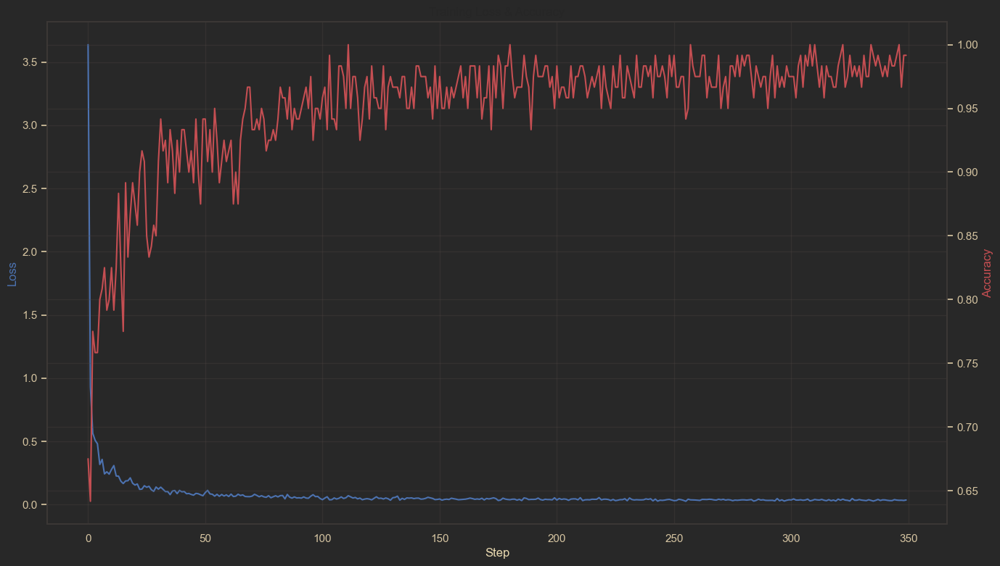

In [23]:
# Loss and accuracy curves
fig, ax1 = plt.subplots(figsize=(16,9))
ax2 = ax1.twinx()
ax1.plot(loss_history, 'b-', label='Loss')
ax2.plot(acc_history, 'r-', label='Accuracy')
ax1.set_xlabel('Step')
ax1.set_ylabel('Loss', color='b')
ax2.set_ylabel('Accuracy', color='r')
plt.title("Training Loss & Accuracy")
plt.show()

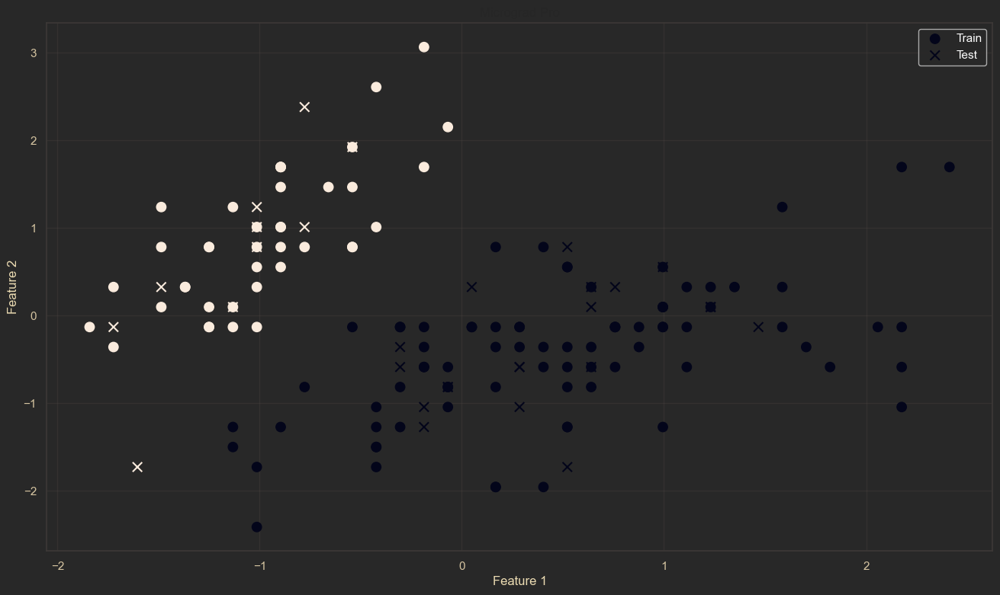

In [24]:
plt.figure(figsize=(16,9))

# Plot train/test points with clear markers
plt.scatter(X_train[:,0], X_train[:,1], c=y_train, label='Train', marker='o', s=80)
plt.scatter(X_test[:,0], X_test[:,1], c=y_test, label='Test', marker='x', s=80)

plt.title("Micrograd Pro")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
leg = plt.legend()
for text in leg.get_texts():
    text.set_color('white')
plt.show()

## Optional: Using Manim for Animation

You can create polished gradient flow animations using Manim library. I might add it later.